# IME672A PROJECT : PREDICTION OF EMPLOYER'S SALARY BASED ON US CENSUS DATA

# Installing Libraries

- pip install sklearn<br>

- pip install seaborn<br>

- pip install plotly<br>

- pip install imblearn<br>



# Importing Libraries

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px  #highly interactive charts
import statistics
%matplotlib inline

In [5]:
# Basic data science pakages
import numpy as np ### For numerical computation
import pandas as pd ### For working with data

# For Creating visualizations 
%matplotlib inline
from matplotlib import pyplot as plt 
import seaborn as sns

# To handle imbalanced data
from imblearn.over_sampling import SMOTE

# For creating training and test set
from sklearn.model_selection import train_test_split

# For column transformation
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, LabelEncoder
from sklearn.compose import make_column_transformer, make_column_selector

# To make pipeline (or automate all the model creation works)
from sklearn.pipeline import make_pipeline

# Machine learning models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

# For Hyperparameter Optimization
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# For evaluating model
from sklearn.metrics import confusion_matrix, classification_report, f1_score, accuracy_score

# Remove all kinds of warning
from warnings import filterwarnings 
filterwarnings('ignore')

In [6]:
# Type of graph that we want
plt.style.use('seaborn-whitegrid')

# Import the Dataset

In [7]:
df=pd.read_excel(r'C:\Users\acer2\Downloads\census.xlsx',sheet_name='census')
print("The dataset has {} rows and {} columns".format(df.shape[0], df.shape[1]))

display(df.head())
display(df.dtypes.value_counts())



The dataset has 31978 rows and 13 columns


,age,workclass,education,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,nativecountry,over50k
0,39,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,less than 50k
1,50,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,less than 50k
2,38,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,less than 50k
3,53,Private,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,less than 50k
4,28,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,less than 50k


object    9
int64     4
dtype: int64

In [8]:
df.shape

(31978, 13)

In [9]:
df.describe()

,age,capitalgain,capitalloss,hoursperweek
count,31978.000000,31978.000000,31978.000000,31978.000000
mean,38.579023,1064.360623,86.739352,40.417850
std,13.662085,7298.596271,401.594301,12.345285
min,17.000000,0.000000,0.000000,1.000000
25%,28.000000,0.000000,0.000000,40.000000
50%,37.000000,0.000000,0.000000,40.000000
75%,48.000000,0.000000,0.000000,45.000000
max,90.000000,99999.000000,4356.000000,99.000000


In [10]:
num_vars = df.columns[df.dtypes != 'object']
cat_vars = df.columns[df.dtypes == 'object']
print("Numerical Columns of the datasets are:\t")
print(num_vars)

print("\nCategorical Columns of the datasets are:\t")
print(cat_vars)

Numerical Columns of the datasets are:	
Index(['age', 'capitalgain', 'capitalloss', 'hoursperweek'], dtype='object')

Categorical Columns of the datasets are:	
Index(['workclass', 'education', 'maritalstatus', 'occupation', 'relationship',
       'race', 'sex', 'nativecountry', 'over50k'],
      dtype='object')


In [11]:
# Total information of data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31978 entries, 0 to 31977
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   age            31978 non-null  int64 
 1   workclass      31978 non-null  object
 2   education      31978 non-null  object
 3   maritalstatus  31978 non-null  object
 4   occupation     31978 non-null  object
 5   relationship   31978 non-null  object
 6   race           31978 non-null  object
 7   sex            31978 non-null  object
 8   capitalgain    31978 non-null  int64 
 9   capitalloss    31978 non-null  int64 
 10  hoursperweek   31978 non-null  int64 
 11  nativecountry  31978 non-null  object
 12  over50k        31978 non-null  object
dtypes: int64(4), object(9)
memory usage: 3.2+ MB


# Data Description

- age : The age of an individual.It varies from 17yrs - 90yrs.


- workclass : a general term to represent the employment status of an individual. Private,Self-emp-not-inc,Local-gov,State-gov,Self-emp-inc,Federal-gov,Without-pay.
 
 
- education : The highest level of education achieved by an individual.HS-grad,Some-college,Bachelors,Masters,Assoc-voc,11th,Assoc-acdm,10th,7th-8th,Prof-school,9th,12th,Doctorate,5th-6th,1st-4th,Preschool.

 
- maritalstatus : marital status of an individual.Married-civ-spouse,Never-married,Divorced,Separated,Widowed,Married-spouse-absent,Married-AF-spouse
 
- occupation :Prof-specialty,Craft-repair,Exec-managerial,Adm-clerical,Sales,Other-service,Machine-op-inspct,Transport-moving,Handlers-cleaners,Farming-fishing,Tech-support,Protective-serv,Priv-house-serv,Armed-Forces.
 

- relationship: Husband,Not-in-family,Own-child,Unmarried,Wife,Other-relative.
 

- race: White,Black,Asian-Pac-Islander,Amer-Indian-Eskimo,Other.


- sex: Male,Female.


- capitalgain: It varies from 0 to 99,999.


- capitalloss:It varies from 0 to 2415.


- hoursperweek: Duration of work per week. It varies from 1 to 99 hours.


- nativecountry:United-States,Mexico,Philippines,Germany,Puerto-Rico,Canada, El-Salvador,Cuba,England,Jamaica,South,Italy,China,Dominican-Republic,Vietnam,Guatemala,Japan,Poland,Columbia,Iran,Haiti,Taiwan,Portugal,Nicaragua,Peru,Greece,FrancEcuador,Ireland,Hong,Cambodia,Trinadad&Tobago,Laos,Thailand,Yugoslavia,Outlying-US(Guam-USVI-etc),Hungary,Honduras,Scotland,Holand-Netherlands.


- Variable type  :<br> 


     Numeric attributes : age, capitalgain, capitalloss and hoursperweekr (4)
  
     Categorical/Nominal attributes :  nativecountry, maritalstatus, relationship ,occupation and workclass (5)
  
     Symmetrical binary attributes : race and sex (2)
  
     Ordinal type attribute : education (1)
  
   
- Target Variable : salary



## DATA PREPROCESSING

## Data cleaning

In [12]:
df.isnull().sum()

age              0
workclass        0
education        0
maritalstatus    0
occupation       0
relationship     0
race             0
sex              0
capitalgain      0
capitalloss      0
hoursperweek     0
nativecountry    0
over50k          0
dtype: int64

#### There are no null values in our Dataset. But We see some "?" values in some columns.

### finding the special characters in the data frame


In [13]:
df.isin([' ?']).sum()

age                 0
workclass        1809
education           0
maritalstatus       0
occupation       1816
relationship        0
race                0
sex                 0
capitalgain         0
capitalloss         0
hoursperweek        0
nativecountry       0
over50k             0
dtype: int64

In [14]:
# Finding which columns have the missing values
missing_val = []
for i in df.columns:
    if (' ?' in df[i].unique()):
        print(i)
        missing_val.append(i)

workclass
occupation


In [15]:
# Looking into each columns which have missing values
for i in missing_val:
    print(i, ':-')
    print('_'*20)
    print(df[i].value_counts())
    print('*'*20, '\n\n')

workclass :-
____________________
 Private             22286
 Self-emp-not-inc     2499
 Local-gov            2067
 ?                    1809
 State-gov            1279
 Self-emp-inc         1074
 Federal-gov           943
 Without-pay            14
 Never-worked            7
Name: workclass, dtype: int64
******************** 


occupation :-
____________________
 Prof-specialty       4038
 Craft-repair         4030
 Exec-managerial      3992
 Adm-clerical         3721
 Sales                3584
 Other-service        3212
 Machine-op-inspct    1966
 ?                    1816
 Transport-moving     1572
 Handlers-cleaners    1350
 Farming-fishing       989
 Tech-support          912
 Protective-serv       644
 Priv-house-serv       143
 Armed-Forces            9
Name: occupation, dtype: int64
******************** 




In [16]:
# Filling misssing values of occupation
replace_occ = df.loc[df['occupation'] != ' ?', 'occupation'].sample(len(df.loc[df['occupation'] == ' ?', 'occupation']))

replace_occ.index = df.loc[df['occupation'] == ' ?'].index

df.loc[df['occupation'] == ' ?', 'occupation'] = replace_occ

In [17]:
# Column (occupation) after filling the missing values
df['occupation'].value_counts()

 Craft-repair         4275
 Prof-specialty       4261
 Exec-managerial      4239
 Adm-clerical         3942
 Sales                3807
 Other-service        3404
 Machine-op-inspct    2073
 Transport-moving     1675
 Handlers-cleaners    1425
 Farming-fishing      1064
 Tech-support          972
 Protective-serv       681
 Priv-house-serv       150
 Armed-Forces           10
Name: occupation, dtype: int64

In [18]:
# Filling missing values of workclass
replace_wkc = df.loc[df['workclass'] != ' ?', 'workclass'].sample(len(df.loc[df['workclass'] == ' ?', 'workclass']))

replace_wkc.index = df.loc[df['workclass'] == ' ?'].index

df.loc[df['workclass'] == ' ?', 'workclass'] = replace_wkc

In [19]:
# Column (workclass) after filling the missing values
df['workclass'].value_counts()

 Private             23595
 Self-emp-not-inc     2668
 Local-gov            2193
 State-gov            1351
 Self-emp-inc         1140
 Federal-gov          1005
 Without-pay            19
 Never-worked            7
Name: workclass, dtype: int64

## HANDLING IMBALANCED DATA

In [20]:
# Here, we can see that we have imbalanced data
pd.DataFrame({'count': df.over50k.value_counts(), '%': df.over50k.value_counts(normalize = True)})


,count,%
less than 50k,24283,0.759366
more than 50k,7695,0.240634


Since,Dataset is imbalanced, We will Balanced it using SMOTE method.

In [21]:
# It will help in balancing imbalanced data
smote = SMOTE()

In [22]:
# Transforming columns into numerical from categorical values
# as it supports numerical and not categorical values
# And also scaling the existing numerical values 

Ordenc = OrdinalEncoder()
labenc = LabelEncoder()
scale = StandardScaler()

num_enc = ['age', 'capitalgain', 'capitalloss', 'hoursperweek']
cat_enc = ['workclass', 'education', 'maritalstatus', 'occupation', 'relationship', 'race', 'sex', 'nativecountry']
cat_enc_tar = ['over50k']

df[cat_enc] = Ordenc.fit_transform(df[cat_enc])
df[cat_enc_tar] = labenc.fit_transform(df[cat_enc_tar])
df[num_enc] = scale.fit_transform(df[num_enc])

In [23]:
# Balancing the data
X_train, y_train = smote.fit_resample(df.loc[:, :'over50k'], df['over50k'])

In [24]:
# Data before balanced
df.head()

,age,workclass,education,maritalstatus,occupation,relationship,race,sex,capitalgain,capitalloss,hoursperweek,nativecountry,over50k
0,0.030814,6.0,9.0,4.0,0.0,1.0,4.0,1.0,0.152037,-0.215991,-0.033847,38.0,0
1,0.835975,5.0,9.0,2.0,3.0,0.0,4.0,1.0,-0.145833,-0.215991,-2.220951,38.0,0
2,-0.042382,3.0,11.0,0.0,5.0,1.0,4.0,1.0,-0.145833,-0.215991,-0.033847,38.0,0
3,1.055564,3.0,1.0,2.0,5.0,0.0,2.0,1.0,-0.145833,-0.215991,-0.033847,38.0,0
4,-0.774347,3.0,9.0,2.0,9.0,5.0,2.0,0.0,-0.145833,-0.215991,-0.033847,4.0,0


In [25]:
# Converting the balanced data into dataframe
X_train = pd.DataFrame(X_train, columns = df.columns[:-1])
y_train = pd.DataFrame(y_train, columns = ['over50k'])

In [26]:
# Building the balanced dataframe 

a = pd.DataFrame(Ordenc.inverse_transform(X_train[cat_enc]), columns = cat_enc)
b = pd.DataFrame(labenc.inverse_transform(y_train), columns = ['over50k'])
c = pd.DataFrame(scale.inverse_transform(X_train[num_enc]), columns = num_enc)

df = pd.merge(a, c, left_index = True, right_index = True)
df = pd.merge(df, b, left_index = True, right_index = True)

In [27]:
# Balanced data frame
df.head()

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,capitalgain,capitalloss,hoursperweek,over50k
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,39.0,2174.0,0.0,40.0,less than 50k
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,50.0,0.0,0.0,13.0,less than 50k
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,38.0,0.0,0.0,40.0,less than 50k
3,Private,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,53.0,0.0,0.0,40.0,less than 50k
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,28.0,0.0,0.0,40.0,less than 50k


In [28]:
# Shape of the balanced dataframe
df.shape

(48566, 13)

In [29]:
# Balanced data for salary column
df.over50k.value_counts()

 less than 50k    24283
 more than 50k    24283
Name: over50k, dtype: int64

### Handling Outliers

In [30]:
# It is a class which will help in checking outliers in different columns of the data
# Here, It uses three techniques to find the outliers (we can use anyone of them)
# The techniques are:-
# * IQR
# * Z score
# * Standard Deviation

class Outliers(object):
    def __init__(self, df, col):
        self.df = df
        self.col = col
        self.min = df[col].min()
        self.max = df[col].max()
        self.mean = df[col].mean()
        self.std = df[col].std()
        self.median = df[col].median()
        self.quantile_25 = df[col].quantile(0.25)
        self.quantile_75 = df[col].quantile(0.75)
        
    @property
    def info(self):
        
        print('{}:- '.format(self.col))
        print('Minimum:- {}'.format(self.min))
        print('Maximum:- {}'.format(self.max))
        print('Mean:- {}'.format(self.mean))
        print('Median:- {}'.format(self.median))
        print('Standard Deviation:- {}'.format(self.std))
        print('First Quantile:- {}'.format(self.quantile_25))
        print('Third Quantile:- {}'.format(self.quantile_75))
        
        
class IQR(Outliers):
    def __init__(self, df, col):
        super().__init__(df, col)   
        self.IQR = self.quantile_75 - self.quantile_25
        self.lower_bound = self.quantile_25 - (1.5 * self.IQR)
        self.upper_bound = self.quantile_75 + (1.5 * self.IQR)
        
    def iqr_outliers(self):
        
        return self.df.loc[(self.df[self.col] < self.lower_bound) | (self.df[self.col] > self.upper_bound), self.col].values
    
    def removed_outliers(self):
        return self.df.loc[(self.df[self.col] > self.lower_bound) & (self.df[self.col] < self.upper_bound)]
    

class Z_score(Outliers):
    def __init__(self, df, col):
        super().__init__(df, col)
        
        pass
    
    def z_score_outliers(self):
        outlier = []
        for i in self.df[self.col]:
            z = (i - self.mean) / self.std
            if abs(z) > 3:
                outlier.append(i)
                
        return outlier
    
    def removed_outliers(self):
        
        df_copy = self.df
        for i in self.z_score_outliers():
            df_copy = df_copy.loc[df_copy[self.col] != i]
            
        return df_copy
    
class StandardDeviation(Outliers):
    def __init__(self, df, col):
        super().__init__(df, col)
        pass
    
    @property
    def std_calc(self):
        lower_std = self.mean - (3 * self.std)
        upper_std = self.mean + (3 * self.std)
        
        return lower_std, upper_std
    
    def std_outliers(self):
        lower_std, upper_std = self.std_calc
        return self.df.loc[(self.df[self.col] < lower_std) | (self.df[self.col] > upper_std), self.col].values
    
    def removed_outliers(self):
        lower_std, upper_std = self.std_calc
        return self.df.loc[(self.df[self.col] > lower_std) & (self.df[self.col] < upper_std)]

In [31]:
# It will show the outliers of the columns

for i in df.columns:
    if df[i].dtype != object:
        
        out = Outliers(df, i)
        iqr = IQR(df, i)
        z_score = Z_score(df, i)
        std = StandardDeviation(df, i)
        
        print('Column:- {}\n'.format(i))
        print('INFO:- \n')
        out.info
        
        print('\nOutlier with IQR:- {}\n'.format(i))
        #print(iqr.iqr_outliers())
        print('----------> dataset shape after removing outliers with iqr:- {}\n'.format(iqr.removed_outliers().shape))
        
        print('\nOutlier with Z_score:- {}\n'.format(i))
        #print(z_score.z_score_outliers())
        print('----------> dataset shape after removing outliers with z_score:- {}\n'.format(z_score.removed_outliers().shape))
        
        print('\nOutlier with Standard deviation:- {}\n'.format(i))
        #print(std.std_outliers())
        print('----------> dataset shape after removing outliers with Standard Deviation:{}\n'.format(std.removed_outliers().shape))
        print('*'*100)

Column:- age

INFO:- 

age:- 
Minimum:- 17.0
Maximum:- 90.0
Mean:- 40.387665459311165
Median:- 40.0
Standard Deviation:- 12.628524698290336
First Quantile:- 31.0
Third Quantile:- 49.0

Outlier with IQR:- age

----------> dataset shape after removing outliers with iqr:- (48309, 13)


Outlier with Z_score:- age

----------> dataset shape after removing outliers with z_score:- (48418, 13)


Outlier with Standard deviation:- age

----------> dataset shape after removing outliers with Standard Deviation:(48418, 13)

****************************************************************************************************
Column:- capitalgain

INFO:- 

capitalgain:- 
Minimum:- 0.0
Maximum:- 99999.0
Mean:- 1945.807269229889
Median:- 0.0
Standard Deviation:- 10230.766021934167
First Quantile:- 0.0
Third Quantile:- 0.0

Outlier with IQR:- capitalgain

----------> dataset shape after removing outliers with iqr:- (0, 13)


Outlier with Z_score:- capitalgain

----------> dataset shape after removing out

- Here, after looking at the outliers we came to the point where we will remove outliers of<br>


        age (z_score or Standard deviation)

        capital gain (average of different groups)

        capital loss (average of different groups)

        hours per week (z_score or standard deviation)



In [32]:
# Removing outliers of age, hoursperweek
df = Z_score(df, 'age').removed_outliers()
df = Z_score(df, 'hoursperweek').removed_outliers()

In [33]:
df = df.reset_index().rename({'index': 'new_index'}, axis = 1).drop('new_index', axis = 1)

In [34]:
# Working on outliers of capitalgain 1
# making the group in which we will substitute the mean values of that group
cap_gn = {}
for i in np.arange(1, 110000, 10000):
    
        cap_gn[str(i) + ' - ' + str(i + 10000)] = df.loc[(df['capitalgain'] >= i) & (df['capitalgain'] < i + 10000), 'capitalgain'].mean()
        
for i,j in cap_gn.items():
    if j is np.nan:
        cap_gn[i] = 0
        
cap_gn

{'1 - 10001': 4837.582508924462,
 '10001 - 20001': 14275.680894557509,
 '20001 - 30001': 24275.925614775286,
 '30001 - 40001': 34095.0,
 '40001 - 50001': 41310.0,
 '50001 - 60001': 0,
 '60001 - 70001': 68295.59363161564,
 '70001 - 80001': 0,
 '80001 - 90001': 0,
 '90001 - 100001': 99999.0,
 '100001 - 110001': 0}

In [35]:
# Working on outliers of capitalgain 2
# Substituing mean values in capitalgain
for i in range(len(df['capitalgain'])):
    for j,k in cap_gn.items(): 
        t = int(j.split(' ')[0])
        r = int(j.split(' ')[-1])
        if (df.loc[i, 'capitalgain'] >= t) & (df.loc[i, 'capitalgain'] < r):
            df.loc[i, 'capitalgain'] = k
    

In [36]:
# capital-gain after handling outliers
df['capitalgain'].value_counts()

0.000000        41123
4837.582509      4396
14275.680895     1477
99999.000000      464
24275.925615      160
34095.000000        4
41310.000000        2
68295.593632        1
Name: capitalgain, dtype: int64

In [37]:
# Doing same as like the capitalloss
cap_ls = {}
for i in np.arange(1, 6000, 1000):
    
        cap_ls[str(i) + ' - ' + str(i + 1000)] = df.loc[(df['capitalloss'] >= i) & (df['capitalloss'] < i + 1000), 'capitalloss'].mean()
        
for i,j in cap_ls.items():
    if j is np.nan:
        cap_ls[i] = 0
        
cap_ls

{'1 - 1001': 576.7396907166634,
 '1001 - 2001': 1838.9706973288369,
 '2001 - 3001': 2287.822634606325,
 '3001 - 4001': 3535.430838561637,
 '4001 - 5001': 4356.0,
 '5001 - 6001': 0}

In [38]:
# same as capitalgain
for i in range(len(df['capitalloss'])):
    for j,k in cap_ls.items(): 
        t = int(j.split(' ')[0])
        r = int(j.split(' ')[-1])
        if (df.loc[i, 'capitalloss'] >= t) & (df.loc[i, 'capitalloss'] < r):
            df.loc[i, 'capitalloss'] = k
    

In [39]:
# # Here also, it don't look good, but i'm gonna keep it (because we can't always remove outliers)
# we can change/remove outliers if we want

df['capitalloss'].value_counts()

0.000000       44522
1838.970697     2449
2287.822635      571
576.739691        75
3535.430839        9
4356.000000        1
Name: capitalloss, dtype: int64

In [40]:
df.shape

(47627, 13)

### EXPLORATORY DATA ANALYSIS 

#### Correlation between columns 

In [41]:
df.corr()

,age,capitalgain,capitalloss,hoursperweek
age,1.000000,0.090063,0.057022,0.102781
capitalgain,0.090063,1.000000,-0.049661,0.098832
capitalloss,0.057022,-0.049661,1.000000,0.059520
hoursperweek,0.102781,0.098832,0.059520,1.000000


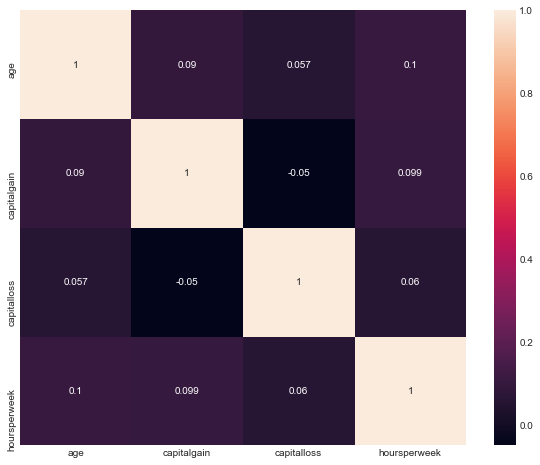

In [42]:
plt.figure(figsize = (10, 8))

sns.heatmap(df.corr(), annot = True)
plt.show()

#### There is no high correlation between any two numeric features.

In [43]:
# Looking into each columns individually
for i in df.columns:
    print('*' * 100)
    print('{}:- {}\n{}\n'.format(i, df[i].nunique(), df[i].unique()))
    print(pd.DataFrame({'count': df[i].value_counts(), '%': df[i].value_counts(normalize = True)}))
    print('/' * 100, '\n\n')

****************************************************************************************************
workclass:- 8
[' State-gov' ' Self-emp-not-inc' ' Private' ' Federal-gov' ' Local-gov'
 ' Self-emp-inc' ' Without-pay' ' Never-worked']

                   count         %
 Private           34301  0.720201
 Self-emp-not-inc   3822  0.080249
 Local-gov          3311  0.069519
 Self-emp-inc       2344  0.049216
 Federal-gov        1856  0.038969
 State-gov          1823  0.038277
 Never-worked        153  0.003212
 Without-pay          17  0.000357
//////////////////////////////////////////////////////////////////////////////////////////////////// 


****************************************************************************************************
education:- 16
[' Bachelors' ' HS-grad' ' 11th' ' Masters' ' 9th' ' Assoc-acdm'
 ' 7th-8th' ' Doctorate' ' Some-college' ' Assoc-voc' ' Prof-school'
 ' 5th-6th' ' 10th' ' 1st-4th' ' Preschool' ' 12th']

               count         %
 HS-grad

workclass


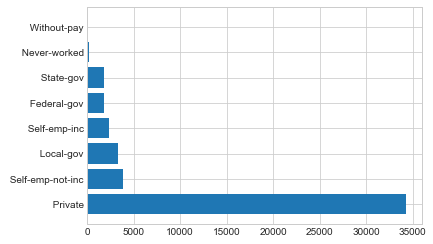

education


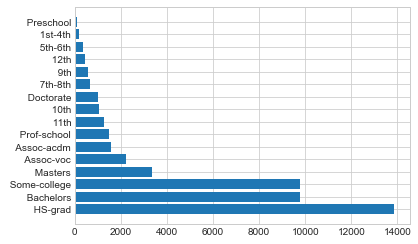

maritalstatus


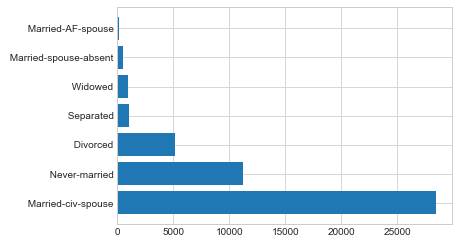

occupation


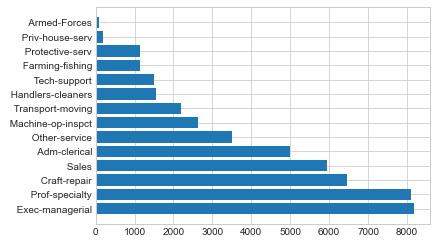

relationship


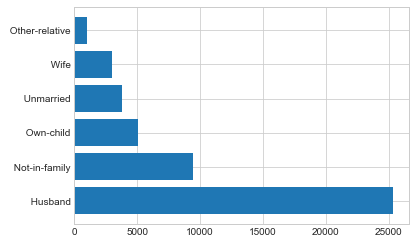

race


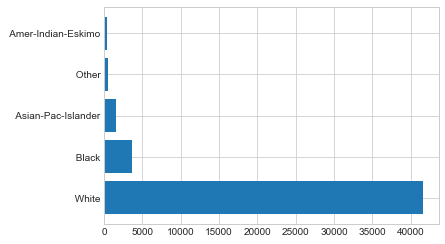

sex


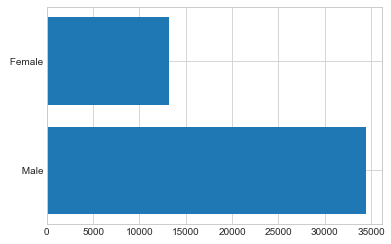

nativecountry


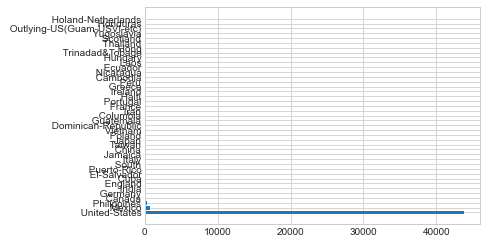

age


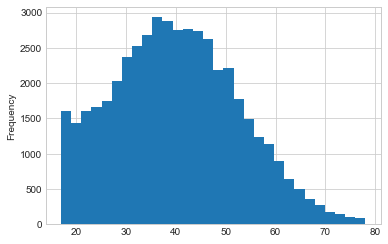

capitalgain


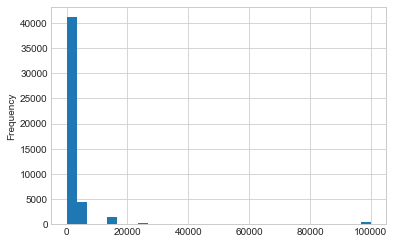

capitalloss


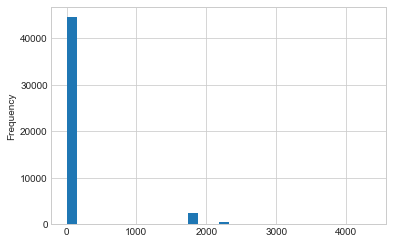

hoursperweek


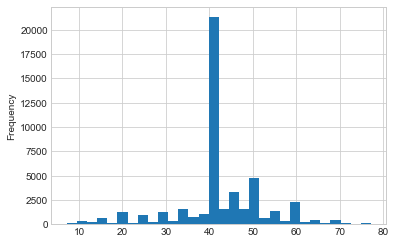

over50k


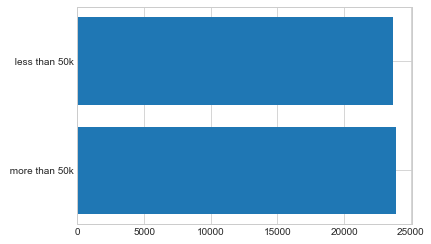

In [44]:
# Distribution of values in columns
for i in df.columns:
    print(i)
    try: 
        df[i].plot.hist(bins = 30)
        plt.show()
    except:
        plt.barh(df[i].value_counts().index, df[i].value_counts().values)
        plt.show()

#### Observations from Histogram:
1.We can group the age columns into bins.

2.For capital Gain and Capital Loss,the data is highly skewed which needs to be tackled.

3.The hours per week can also be split into bins.

In [45]:
display(df.describe())

,age,capitalgain,capitalloss,hoursperweek
count,47627.000000,47627.000000,47627.000000,47627.000000
mean,40.199417,1951.039811,123.657092,41.909244
std,12.346144,10214.916668,473.966294,10.410758
min,17.000000,0.000000,0.000000,7.156225
25%,31.000000,0.000000,0.000000,40.000000
50%,39.991274,0.000000,0.000000,40.000000
75%,49.000000,0.000000,0.000000,48.000000
max,78.000000,99999.000000,4356.000000,77.190915


## Salary

In [46]:
df.over50k.value_counts()

 more than 50k    23922
 less than 50k    23705
Name: over50k, dtype: int64

In [47]:
percentage_salary=(df.over50k.value_counts()/len(df))*100
percentage_salary.sort_values(ascending=False)

 more than 50k    50.227812
 less than 50k    49.772188
Name: over50k, dtype: float64

#### Since,our dataset is balanced,so there is approx equal number of employees having salary less than 50k dollars and having salary more than 50k dollars.

In [48]:
df.groupby('over50k').mean()

,age,capitalgain,capitalloss,hoursperweek
over50k,,,,
less than 50k,36.426830,210.817726,57.122969,38.769078
more than 50k,43.937782,3675.476084,189.587674,45.020924


### Sex

In [49]:
df.sex.value_counts()

 Male      34429
 Female    13198
Name: sex, dtype: int64

In [50]:
percentage_sex=(df.sex.value_counts()/len(df))*100
percentage_sex.sort_values(ascending=False)

 Male      72.288828
 Female    27.711172
Name: sex, dtype: float64

#### More male employees than female employees.

In [51]:
#effect of two classes of salary with respect two gender feature 
pd.crosstab(df.sex , df.over50k, margins=True , normalize=True)

over50k,less than 50k,more than 50k,All
sex,,,
Female,0.193882,0.083230,0.277112
Male,0.303840,0.419048,0.722888
All,0.497722,0.502278,1.000000


Text(0, 0.5, 'Frequency of Salary')

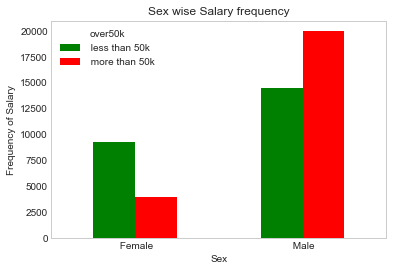

In [52]:
pd.crosstab(df.sex,df.over50k).plot(kind='bar',color=('green','red'))
plt.xticks(rotation='horizontal')
plt.grid()
plt.title('Sex wise Salary frequency')
plt.xlabel('Sex')
plt.ylabel('Frequency of Salary')


px.histogram(df, x='sex', title='sex vs. over50k', color='over50k')

#### There is more numbers of males having salary more than 50k dollars.

### Chi-square test for independence between sex and salary

In [53]:
table = pd.crosstab(df.over50k,df.sex)
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(table.values)
print( 'chi2 statistics: %0.3f dof %d' % (chi2 , dof))
significance = 0.05
if p < significance:
    print("""At %.2f level of significance, we reject the null hypotheses and accept H1. 
They are not independent.""" % (significance))
else:
    print("""At %.2f level of significance, we accept the null hypotheses. 
They are independent.""" % (significance))

chi2 statistics: 2976.753 dof 1
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
They are not independent.


### Workclass

In [54]:
#count for different class in workclass columns
df.workclass.value_counts()

 Private             34301
 Self-emp-not-inc     3822
 Local-gov            3311
 Self-emp-inc         2344
 Federal-gov          1856
 State-gov            1823
 Never-worked          153
 Without-pay            17
Name: workclass, dtype: int64

In [55]:
percentage_workclass=(df.workclass.value_counts()/len(df))*100
percentage_workclass.sort_values(ascending=False)

 Private             72.020073
 Self-emp-not-inc     8.024860
 Local-gov            6.951939
 Self-emp-inc         4.921578
 Federal-gov          3.896949
 State-gov            3.827661
 Never-worked         0.321246
 Without-pay          0.035694
Name: workclass, dtype: float64

#### 72 percent of employees belong to the private workclass category.

Text(0, 0.5, 'Frequency')

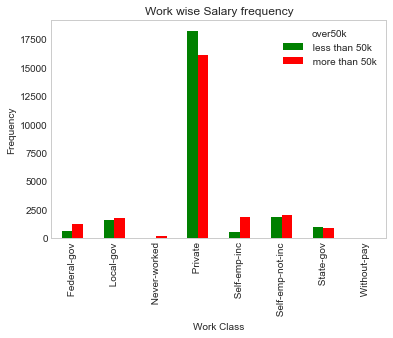

In [56]:
pd.crosstab(df.workclass,df.over50k).plot(kind='bar',color=('green','red'))
plt.xticks(rotation='vertical')
plt.grid()
plt.title('Work wise Salary frequency')
plt.xlabel('Work Class')
plt.ylabel('Frequency')


In [57]:
px.histogram(df, x='workclass', title='workclass vs. over50k', color='over50k')

#### There are more employees who are belonging to Private sectors and earning less than 50k dollars.

### Chi-square test for independence between Workclass and Salary

In [58]:
table=pd.crosstab(df.over50k,df.workclass)
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(table.values)
print( 'chi2 statistics: %0.3f dof %d' % (chi2 , dof))
significance = 0.05
if p < significance:
    print("""At %.2f level of significance, we reject the null hypotheses and accept H1. 
They are not independent.""" % (significance))
else:
    print("""At %.2f level of significance, we accept the null hypotheses. 
They are independent.""" % (significance))

chi2 statistics: 1293.542 dof 7
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
They are not independent.


### Race

In [59]:
df.race.value_counts()

 White                 41570
 Black                  3620
 Asian-Pac-Islander     1544
 Other                   533
 Amer-Indian-Eskimo      360
Name: race, dtype: int64

In [60]:
percentage_race=(df.race.value_counts()/len(df))*100
percentage_race.sort_values(ascending=False)

 White                 87.282424
 Black                  7.600731
 Asian-Pac-Islander     3.241859
 Other                  1.119113
 Amer-Indian-Eskimo     0.755874
Name: race, dtype: float64

#### 87 percentage of total employees are of white races.

In [61]:
pd.crosstab(df.race , df.over50k, margins=True , normalize=True)

over50k,less than 50k,more than 50k,All
race,,,
Amer-Indian-Eskimo,0.005648,0.001911,0.007559
Asian-Pac-Islander,0.014257,0.018162,0.032419
Black,0.055011,0.020996,0.076007
Other,0.004724,0.006467,0.011191
White,0.418082,0.454742,0.872824
All,0.497722,0.502278,1.000000


Text(0, 0.5, 'Frequency of Salary')

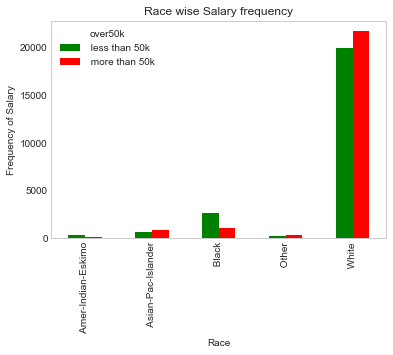

In [62]:
pd.crosstab(df.race,df.over50k).plot(kind='bar',color=('green','red'))
plt.xticks(rotation='vertical')
plt.grid()
plt.title('Race wise Salary frequency')
plt.xlabel('Race')
plt.ylabel('Frequency of Salary')


In [63]:
px.histogram(df, x='race', title='race vs. over50k', color='over50k')

#### The dataset contains majority of employees from White and Black Races while all other races are very few in count, So we'll combine all other race data into one class labeled as "Others"

In [64]:
loc = []
x = dict(df['race'].value_counts())
for k,v in x.items():
        if v > 1000:
            loc.append(k)
            
df['race'] = [j if j in loc else 'others' for i,j in df['race'].iteritems()]

In [65]:
df.head()

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,capitalgain,capitalloss,hoursperweek,over50k
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,39.0,4837.582509,0.0,40.0,less than 50k
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,50.0,0.000000,0.0,13.0,less than 50k
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,38.0,0.000000,0.0,40.0,less than 50k
3,Private,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,53.0,0.000000,0.0,40.0,less than 50k
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,28.0,0.000000,0.0,40.0,less than 50k


In [66]:

df.race.value_counts()

 White                 41570
 Black                  3620
 Asian-Pac-Islander     1544
others                   893
Name: race, dtype: int64

## Chi square test of independence between race and salary

In [67]:
table=pd.crosstab(df.over50k,df.race)
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(table.values)
print( 'chi2 statistics: %0.3f dof %d' % (chi2, dof))
significance = 0.05
if p < significance:
    print("""At %.2f level of significance, we reject the null hypotheses and accept H1. 
They are not independent.""" % (significance))
else:
    print("""At %.2f level of significance, we accept the null hypotheses. 
They are independent.""" % (significance))

chi2 statistics: 829.849 dof 3
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
They are not independent.


### Age

In [68]:
df.age.value_counts()

36.000000    931
34.000000    922
33.000000    918
37.000000    901
31.000000    900
            ... 
30.968221      1
33.208919      1
38.962015      1
38.095544      1
51.833901      1
Name: age, Length: 14690, dtype: int64

### Violen Plot for Age

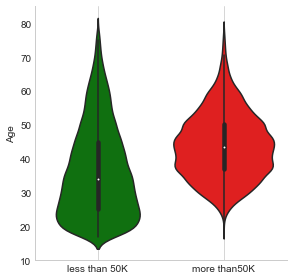

In [69]:
g=sns.catplot( y='age',x='over50k' , data=df  , kind='violin' , palette=['green','red'],height=4,legend=True)
(g.set_axis_labels("", "Age")
  .set_xticklabels(["less than 50K" , "more than50K"]))

plt.grid()
plt.savefig('age.png',dpi=300)

#### The violen plot shows maximum number of employees who earns "less than 50k" dollars have age approx 25 and who earn "more than 50k" dollars have age approx 45.

### Creating Buckets for Age

In [70]:
#changing age from numeric to categorical type
bins = [0,25,50,75,100]
group_names = [ 'young', 'adult', 'senior', 'old']
df['age'] = pd.cut(df['age'], bins, labels = group_names)
df.head()

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,capitalgain,capitalloss,hoursperweek,over50k
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,adult,4837.582509,0.0,40.0,less than 50k
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,adult,0.000000,0.0,13.0,less than 50k
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,adult,0.000000,0.0,40.0,less than 50k
3,Private,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,senior,0.000000,0.0,40.0,less than 50k
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,adult,0.000000,0.0,40.0,less than 50k


Text(0, 0.5, 'Frequency')

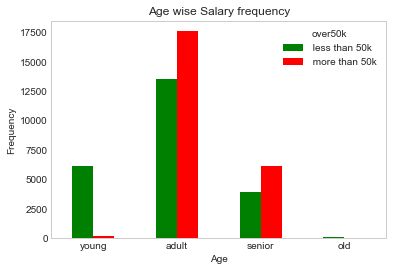

In [71]:
pd.crosstab(df.age,df.over50k).plot(kind='bar',color=('green','red'))
plt.xticks(rotation='horizontal')
plt.grid()
plt.title('Age wise Salary frequency')
plt.xlabel('Age')
plt.ylabel('Frequency')


In [72]:
px.histogram(df, x='age', title='age vs. over50k', color='over50k')

#### There are more adults in our dataset . Also, Negligible amount of old people.

### Chi-square for independence between age and salary

In [73]:
table=pd.crosstab(df.over50k,df.age)
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(table.values)
print( 'chi2 statistics: %0.3f dof %d' % (chi2 , dof))
significance = 0.05
if p < significance:
    print("""At %.2f level of significance, we reject the null hypotheses and accept H1. 
They are not independent.""" % (significance))
else:
    print("""At %.2f level of significance, we accept the null hypotheses. 
They are independent.""" % (significance))

chi2 statistics: 6623.320 dof 3
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
They are not independent.


### Hours Per Week

In [74]:
df.hoursperweek.value_counts()

40.000000    19909
50.000000     4016
45.000000     2224
60.000000     1982
35.000000     1302
             ...  
41.317165        1
43.460411        1
57.091655        1
28.769895        1
39.300193        1
Name: hoursperweek, Length: 8912, dtype: int64

### Creating Buckets for Hours per week

In [75]:
#changing hoursPerWeek from mumeric to categorical type
bins = [0,40,80]
group_names = [ 'Less Hours', 'Normal Hours']
df['hoursperweek'] = pd.cut(df['hoursperweek'], bins, labels = group_names)
df.head()

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,capitalgain,capitalloss,hoursperweek,over50k
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,adult,4837.582509,0.0,Less Hours,less than 50k
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,adult,0.000000,0.0,Less Hours,less than 50k
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,adult,0.000000,0.0,Less Hours,less than 50k
3,Private,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,senior,0.000000,0.0,Less Hours,less than 50k
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,adult,0.000000,0.0,Less Hours,less than 50k


In [76]:
df.hoursperweek.value_counts()

Less Hours      29068
Normal Hours    18559
Name: hoursperweek, dtype: int64

In [77]:
percentage_hoursperweek=(df.hoursperweek.value_counts()/len(df))*100
percentage_hoursperweek.sort_values(ascending=False)


Less Hours      61.032608
Normal Hours    38.967392
Name: hoursperweek, dtype: float64

#### 61 percentage of employees belong to the "Less Hours" class. 

Text(0, 0.5, 'Frequency')

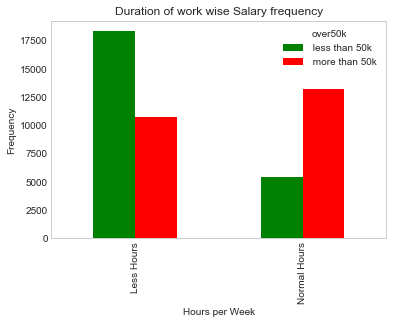

In [78]:
pd.crosstab(df.hoursperweek,df.over50k).plot(kind='bar',color=('green','red'))
plt.xticks(rotation='vertical')
plt.grid()
plt.title('Duration of work wise Salary frequency')
plt.xlabel('Hours per Week')
plt.ylabel('Frequency')


In [79]:
px.histogram(df, x='hoursperweek', title='hoursperweek vs. over50k', color='over50k')

#### People who work "Less Hours" tend to have salary more than 50k dollars

### Chi-square test for independence between hoursperweek and salary

In [80]:
table=pd.crosstab(df.over50k,df.hoursperweek)
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(table.values)
print( 'chi2 statistics: %0.3f dof %d' % (chi2 , dof))
significance = 0.05
if p < significance:
    print("""At %.2f level of significance, we reject the null hypotheses and accept H1. 
They are not independent.""" % (significance))
else:
    print("""At %.2f level of significance, we accept the null hypotheses. 
They are independent.""" % (significance))

chi2 statistics: 5260.950 dof 1
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
They are not independent.


### Marital Status

In [81]:
df.maritalstatus.value_counts()

 Married-civ-spouse       28439
 Never-married            11221
 Divorced                  5195
 Separated                 1101
 Widowed                    957
 Married-spouse-absent      561
 Married-AF-spouse          153
Name: maritalstatus, dtype: int64

In [82]:
percentage_maritalstatus=(df.maritalstatus.value_counts()/len(df))*100
percentage_maritalstatus.sort_values(ascending=False)


 Married-civ-spouse       59.711928
 Never-married            23.560165
 Divorced                 10.907678
 Separated                 2.311714
 Widowed                   2.009364
 Married-spouse-absent     1.177903
 Married-AF-spouse         0.321246
Name: maritalstatus, dtype: float64

### Relationship 

In [83]:
df.relationship.value_counts()

 Husband           25341
 Not-in-family      9431
 Own-child          5058
 Unmarried          3760
 Wife               3033
 Other-relative     1004
Name: relationship, dtype: int64

In [84]:
percentage_relationship=(df.relationship.value_counts()/len(df))*100
percentage_relationship.sort_values(ascending=False)


 Husband           53.207214
 Not-in-family     19.801793
 Own-child         10.620026
 Unmarried          7.894682
 Wife               6.368237
 Other-relative     2.108048
Name: relationship, dtype: float64

#### The features "Relationship" and "maritalstatus" have no missing values. Also,there is some overlap between the two such as if the person is husband or wife,then their marital status would be Married. However,as there is no complete overlap, We'll keep both these columns. 

### Occupation 

In [85]:
df.occupation.value_counts()

 Exec-managerial      8190
 Prof-specialty       8112
 Craft-repair         6459
 Sales                5940
 Adm-clerical         5006
 Other-service        3508
 Machine-op-inspct    2619
 Transport-moving     2189
 Handlers-cleaners    1562
 Tech-support         1500
 Farming-fishing      1137
 Protective-serv      1136
 Priv-house-serv       190
 Armed-Forces           79
Name: occupation, dtype: int64

In [86]:
percentage_occupation=(df.occupation.value_counts()/len(df))*100
percentage_occupation.sort_values(ascending=False)


 Exec-managerial      17.196128
 Prof-specialty       17.032356
 Craft-repair         13.561635
 Sales                12.471917
 Adm-clerical         10.510845
 Other-service         7.365570
 Machine-op-inspct     5.498982
 Transport-moving      4.596132
 Handlers-cleaners     3.279652
 Tech-support          3.149474
 Farming-fishing       2.387301
 Protective-serv       2.385202
 Priv-house-serv       0.398933
 Armed-Forces          0.165872
Name: occupation, dtype: float64

Text(0, 0.5, 'Frequency')

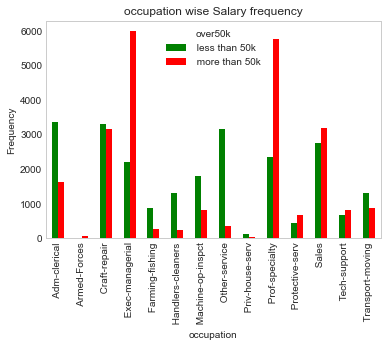

In [87]:
pd.crosstab(df.occupation,df.over50k).plot(kind='bar',color=('green','red'))
plt.xticks(rotation='vertical')
plt.grid()
plt.title('occupation wise Salary frequency')
plt.xlabel('occupation')
plt.ylabel('Frequency')


In [88]:
px.histogram(df, x='occupation', title='occupation vs. over50k', color='over50k')

#### The distribution of income varies across all the various occupations. The categories are already uniquely identificable and we will keep them as it is.

### Chi-square for independence between occupation and salary

In [89]:
table=pd.crosstab(df.over50k,df.occupation)
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(table.values)
print( 'chi2 statistics: %0.3f dof %d' % (chi2 , dof))
significance = 0.05
if p < significance:
    print("""At %.2f level of significance, we reject the null hypotheses and accept H1. 
They are not independent.""" % (significance))
else:
    print("""At %.2f level of significance, we accept the null hypotheses. 
They are independent.""" % (significance))

chi2 statistics: 7745.251 dof 13
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
They are not independent.


### Education

In [90]:
df.education.value_counts()

 HS-grad         13833
 Bachelors        9785
 Some-college     9784
 Masters          3343
 Assoc-voc        2228
 Assoc-acdm       1591
 Prof-school      1480
 11th             1259
 10th             1038
 Doctorate        1003
 7th-8th           653
 9th               563
 12th              435
 5th-6th           344
 1st-4th           177
 Preschool         111
Name: education, dtype: int64

In [91]:
percentage_education=(df.education.value_counts()/len(df))*100
percentage_education.sort_values(ascending=False)


 HS-grad         29.044450
 Bachelors       20.545069
 Some-college    20.542969
 Masters          7.019128
 Assoc-voc        4.678019
 Assoc-acdm       3.340542
 Prof-school      3.107481
 11th             2.643459
 10th             2.179436
 Doctorate        2.105948
 7th-8th          1.371071
 9th              1.182103
 12th             0.913347
 5th-6th          0.722279
 1st-4th          0.371638
 Preschool        0.233061
Name: education, dtype: float64

In [92]:
px.histogram(df, x='education', title='education vs. over50k', color='over50k')

### we will combine school students from preschool to 12th into one class labeled as "no college/university".

In [93]:
df = df.replace({" Preschool" : "no college/university",
           " 1st-4th" : "no college/university",
           " 5th-6th" : "no college/university",
           " 7th-8th" : "no college/university",
           " 9th" : "no college/university",
           " 10th" : "no college/university",
           " 11th" : "no college/university",
           " 12th" : "no college/university"})

In [94]:
df.education.value_counts()

 HS-grad                 13833
 Bachelors                9785
 Some-college             9784
no college/university     4580
 Masters                  3343
 Assoc-voc                2228
 Assoc-acdm               1591
 Prof-school              1480
 Doctorate                1003
Name: education, dtype: int64

In [95]:
percentage_education=(df.education.value_counts()/len(df))*100
percentage_education.sort_values(ascending=False)


 HS-grad                 29.044450
 Bachelors               20.545069
 Some-college            20.542969
no college/university     9.616394
 Masters                  7.019128
 Assoc-voc                4.678019
 Assoc-acdm               3.340542
 Prof-school              3.107481
 Doctorate                2.105948
Name: education, dtype: float64

### Chi-square for independence between education and salary

In [96]:
table=pd.crosstab(df.over50k,df.education)
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(table.values)
print( 'chi2 statistics: %0.3f dof %d' % (chi2 , dof))
significance = 0.05
if p < significance:
    print("""At %.2f level of significance, we reject the null hypotheses and accept H1. 
They are not independent.""" % (significance))
else:
    print("""At %.2f level of significance, we accept the null hypotheses. 
They are independent.""" % (significance))

chi2 statistics: 7346.167 dof 8
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
They are not independent.


### Native Country 

In [97]:
df.nativecountry.value_counts()

 United-States                 43755
 Mexico                          685
 Philippines                     341
 Canada                          229
 Germany                         218
 India                           208
 England                         146
 Cuba                            133
 El-Salvador                     133
 Puerto-Rico                     126
 South                           122
 Italy                           114
 Jamaica                         114
 China                           109
 Taiwan                           90
 Japan                            89
 Poland                           82
 Vietnam                          73
 Dominican-Republic               73
 Guatemala                        72
 Columbia                         72
 Iran                             61
 France                           57
 Portugal                         47
 Haiti                            46
 Ireland                          40
 Greece                           37
 

In [98]:
percentage_nativecountry=(df.nativecountry.value_counts()/len(df))*100
percentage_nativecountry.sort_values(ascending=False)


 United-States                 91.870158
 Mexico                         1.438260
 Philippines                    0.715980
 Canada                         0.480820
 Germany                        0.457724
 India                          0.436727
 England                        0.306549
 Cuba                           0.279253
 El-Salvador                    0.279253
 Puerto-Rico                    0.264556
 South                          0.256157
 Italy                          0.239360
 Jamaica                        0.239360
 China                          0.228862
 Taiwan                         0.188968
 Japan                          0.186869
 Poland                         0.172171
 Vietnam                        0.153274
 Dominican-Republic             0.153274
 Columbia                       0.151175
 Guatemala                      0.151175
 Iran                           0.128079
 France                         0.119680
 Portugal                       0.098684
 Haiti          

#### 92 percent of employees comes from United-States.

Text(0, 0.5, 'Frequency')

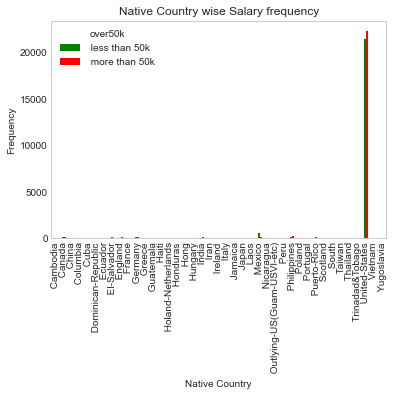

In [99]:
pd.crosstab(df.nativecountry,df.over50k).plot(kind='bar',color=('green','red'))
plt.xticks(rotation='vertical')
plt.grid()
plt.title('Native Country wise Salary frequency')
plt.xlabel('Native Country')
plt.ylabel('Frequency')


In [100]:
px.histogram(df, x='nativecountry', title='nativecountry vs. over50k', color='over50k')

#### The majority of employees are from United States.Thus, we can make 'United-States" as one class and rest countries labeled as "others" class. 

In [101]:
loc = []
x = dict(df['nativecountry'].value_counts())
for k,v in x.items():
        if v > 1000:
            loc.append(k)
            
df['nativecountry'] = [j if j in loc else 'others' for i,j in df['nativecountry'].iteritems()]

In [102]:
df.head()

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,capitalgain,capitalloss,hoursperweek,over50k
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,adult,4837.582509,0.0,Less Hours,less than 50k
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,adult,0.000000,0.0,Less Hours,less than 50k
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,adult,0.000000,0.0,Less Hours,less than 50k
3,Private,no college/university,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,senior,0.000000,0.0,Less Hours,less than 50k
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,others,adult,0.000000,0.0,Less Hours,less than 50k


In [103]:
df.nativecountry.value_counts()

 United-States    43755
others             3872
Name: nativecountry, dtype: int64

In [104]:
percentage_nativecountry=(df.nativecountry.value_counts()/len(df))*100
percentage_nativecountry.sort_values(ascending=False)


 United-States    91.870158
others             8.129842
Name: nativecountry, dtype: float64

### Chi-square for independence between nativecountry and salary

In [105]:
table=pd.crosstab(df.over50k,df.nativecountry)
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(table.values)
print( 'chi2 statistics: %0.3f dof %d' % (chi2, dof))
significance = 0.05
if p < significance:
    print("""At %.2f level of significance, we reject the null hypotheses and accept H1. 
They are not independent.""" % (significance))
else:
    print("""At %.2f level of significance, we accept the null hypotheses. 
They are independent.""" % (significance))

chi2 statistics: 108.987 dof 1
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
They are not independent.


## Capital Gain and Capital Loss

In [106]:
df.capitalgain.value_counts()

0.000000        41123
4837.582509      4396
14275.680895     1477
99999.000000      464
24275.925615      160
34095.000000        4
41310.000000        2
68295.593632        1
Name: capitalgain, dtype: int64

In [107]:
percentage_capitalgain=(df.capitalgain.value_counts()/len(df))*100
percentage_capitalgain.sort_values(ascending=False)


0.000000        86.343881
4837.582509      9.230059
14275.680895     3.101182
99999.000000     0.974237
24275.925615     0.335944
34095.000000     0.008399
41310.000000     0.004199
68295.593632     0.002100
Name: capitalgain, dtype: float64

#### Approx 86 percent of employees have Capital Gain as 0 dollars. 

In [108]:
df.capitalloss.value_counts()

0.000000       44522
1838.970697     2449
2287.822635      571
576.739691        75
3535.430839        9
4356.000000        1
Name: capitalloss, dtype: int64

In [109]:
percentage_capitalloss=(df.capitalloss.value_counts()/len(df))*100
percentage_capitalloss.sort_values(ascending=False)


0.000000       93.480589
1838.970697     5.142041
2287.822635     1.198900
576.739691      0.157474
3535.430839     0.018897
4356.000000     0.002100
Name: capitalloss, dtype: float64

#### 93 percent of employees have Capital loss 0 dollars. 

#### Feature generation : As "capital Loss" and "capital gain" are related we drop both the columns and their difference is labeled as "Capital Difference". For analysing data,we created two buckets Minor for -5000 dollars to 5000 dollars and Major for 5000 dollars to 100000 dollars.

#### Capital Difference:- Capital Gain + Capital Loss

In [110]:
df['Capital_Difference'] = df['capitalgain'] + df['capitalloss']
df = df.drop([ "capitalgain", "capitalloss" ], axis = 1 )
df.head()

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,hoursperweek,over50k,Capital_Difference
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,adult,Less Hours,less than 50k,4837.582509
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,adult,Less Hours,less than 50k,0.000000
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,adult,Less Hours,less than 50k,0.000000
3,Private,no college/university,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,senior,Less Hours,less than 50k,0.000000
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,others,adult,Less Hours,less than 50k,0.000000


In [111]:
#creating buckets for Capital_Difference feature
bins = [-5000,5000,100000]
group_names = [ 'Minor', 'Major']
df['Capital_Difference'] = pd.cut(df['Capital_Difference'], bins, labels = group_names)
df.head()

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,hoursperweek,over50k,Capital_Difference
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,adult,Less Hours,less than 50k,Minor
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,adult,Less Hours,less than 50k,Minor
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,adult,Less Hours,less than 50k,Minor
3,Private,no college/university,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,senior,Less Hours,less than 50k,Minor
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,others,adult,Less Hours,less than 50k,Minor


In [112]:
df.Capital_Difference.value_counts()

Minor    45510
Major     2117
Name: Capital_Difference, dtype: int64

In [113]:
percentage_Capital_Difference=(df.Capital_Difference.value_counts()/len(df))*100
percentage_Capital_Difference.sort_values(ascending=False)


Minor    95.555042
Major     4.444958
Name: Capital_Difference, dtype: float64

#### 95 percent of employees belong to the Minor class of "Capital Difference" feature

Text(0, 0.5, 'Frequency')

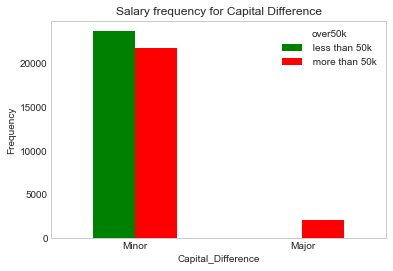

In [114]:
pd.crosstab(df.Capital_Difference,df.over50k).plot(kind='bar',color=('green','red'))
plt.xticks(rotation='horizontal')
plt.grid()
plt.title('Salary frequency for Capital Difference')
plt.xlabel('Capital_Difference')
plt.ylabel('Frequency')


In [115]:
px.histogram(df, x='Capital_Difference', title='Capital_Difference vs. over50k', color='over50k')

####  In minor category, there are more number of employees having salary greater than 50k dollars

### Chi-square for independence between Capital_difference and salary 

In [116]:
table=pd.crosstab(df.over50k,df.Capital_Difference)
from scipy.stats import chi2_contingency
chi2, p, dof, expected = chi2_contingency(table.values)
print( 'chi2 statistics: %0.3f dof %d' % (chi2, dof))
significance = 0.05
if p < significance:
    print("""At %.2f level of significance, we reject the null hypotheses and accept H1. 
They are not independent.""" % (significance))
else:
    print("""At %.2f level of significance, we accept the null hypotheses. 
They are independent.""" % (significance))

chi2 statistics: 2143.601 dof 1
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
They are not independent.


### Assigning Salary column with "less than 50k" to 0 and "more than 50k" to 1

In [117]:
df['over50k'] = df['over50k'].map({' less than 50k' : 0, ' more than 50k' : 1}).astype(int)

In [118]:
df.head()

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,hoursperweek,over50k,Capital_Difference
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,adult,Less Hours,0,Minor
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,adult,Less Hours,0,Minor
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,adult,Less Hours,0,Minor
3,Private,no college/university,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,senior,Less Hours,0,Minor
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,others,adult,Less Hours,0,Minor


### Machine Learning Model 

In [119]:
from sklearn.model_selection import train_test_split

### Training, Validation and Test Sets 

While building real-world machine learning models, it is quite common to split the dataset into three parts:

- Training set - used to train the model, i.e., compute the loss and adjust the model's weights using an optimization technique.
- Validation set - used to evaluate the model during training, tune model hyperparameters (optimization technique, regularization etc.), and pick the best version of the model. Picking a good validation set is essential for training models that generalize well.
- Test set - used to compare different models or approaches and report the model's final accuracy. For many datasets, test sets are provided separately. The test set should reflect the kind of data the model will encounter in the real-world, as closely as feasible.

<img src="https://i.imgur.com/j8eITrK.png" width="480">


We will divide the dataset such that 60% of the data for the training set, 20% for the validation set and 20% for the test set. So,we have 75%-25% training-validation split.

In [120]:
train_val_df, test_df = train_test_split(df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [121]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (28575, 12)
val_df.shape : (9526, 12)
test_df.shape : (9526, 12)


## Input and Target Columns

In [122]:
input_cols = list(train_df.columns[train_df.columns !='over50k'])

target_col = 'over50k'

In [123]:
input_cols

['workclass',
 'education',
 'maritalstatus',
 'occupation',
 'relationship',
 'race',
 'sex',
 'nativecountry',
 'age',
 'hoursperweek',
 'Capital_Difference']

In [124]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [125]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [126]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [127]:
train_inputs

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,hoursperweek,Capital_Difference
2671,Private,Some-college,Never-married,Sales,Not-in-family,White,Female,United-States,young,Normal Hours,Minor
8959,Private,HS-grad,Married-civ-spouse,Adm-clerical,Husband,White,Male,United-States,senior,Normal Hours,Minor
15470,Local-gov,Bachelors,Never-married,Adm-clerical,Other-relative,Black,Female,United-States,young,Less Hours,Minor
7521,Private,no college/university,Separated,Other-service,Not-in-family,White,Male,others,adult,Less Hours,Minor
42435,Private,Assoc-voc,Married-civ-spouse,Craft-repair,Husband,White,Male,United-States,adult,Less Hours,Minor
...,...,...,...,...,...,...,...,...,...,...,...
32190,Local-gov,Bachelors,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,senior,Less Hours,Minor
21480,Private,HS-grad,Married-civ-spouse,Craft-repair,Husband,White,Male,United-States,adult,Less Hours,Minor
24212,Private,Some-college,Married-civ-spouse,Craft-repair,Husband,White,Male,United-States,senior,Less Hours,Minor
3142,Private,Some-college,Never-married,Farming-fishing,Other-relative,White,Male,United-States,adult,Normal Hours,Minor


In [128]:
train_targets

2671     0
8959     1
15470    0
7521     0
42435    1
        ..
32190    1
21480    1
24212    0
3142     0
3182     0
Name: over50k, Length: 28575, dtype: int32

### Encoding Categorical Data 

we need to convert categorical data to binary. A common technique is to use one-hot encoding for categorical columns.

<img src="https://i.imgur.com/n8GuiOO.png" width="640">

One hot encoding involves adding a new binary (0/1) column for each unique category of a categorical column.

In [129]:
categorical_cols = train_inputs.columns.tolist()

In [130]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
encoder.fit(df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [131]:
encoder.categories_

[array([' Federal-gov', ' Local-gov', ' Never-worked', ' Private',
        ' Self-emp-inc', ' Self-emp-not-inc', ' State-gov', ' Without-pay'],
       dtype=object),
 array([' Assoc-acdm', ' Assoc-voc', ' Bachelors', ' Doctorate',
        ' HS-grad', ' Masters', ' Prof-school', ' Some-college',
        'no college/university'], dtype=object),
 array([' Divorced', ' Married-AF-spouse', ' Married-civ-spouse',
        ' Married-spouse-absent', ' Never-married', ' Separated',
        ' Widowed'], dtype=object),
 array([' Adm-clerical', ' Armed-Forces', ' Craft-repair',
        ' Exec-managerial', ' Farming-fishing', ' Handlers-cleaners',
        ' Machine-op-inspct', ' Other-service', ' Priv-house-serv',
        ' Prof-specialty', ' Protective-serv', ' Sales', ' Tech-support',
        ' Transport-moving'], dtype=object),
 array([' Husband', ' Not-in-family', ' Other-relative', ' Own-child',
        ' Unmarried', ' Wife'], dtype=object),
 array([' Asian-Pac-Islander', ' Black', ' White', 'o

In [132]:
encoded_cols = list(encoder.get_feature_names(categorical_cols))
print(encoded_cols)

['workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Prof-school', 'education_ Some-college', 'education_no college/university', 'maritalstatus_ Divorced', 'maritalstatus_ Married-AF-spouse', 'maritalstatus_ Married-civ-spouse', 'maritalstatus_ Married-spouse-absent', 'maritalstatus_ Never-married', 'maritalstatus_ Separated', 'maritalstatus_ Widowed', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occ

In [133]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

In [134]:
pd.set_option('display.max_columns', None)

In [135]:
val_inputs

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,hoursperweek,Capital_Difference,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Prof-school,education_ Some-college,education_no college/university,maritalstatus_ Divorced,maritalstatus_ Married-AF-spouse,maritalstatus_ Married-civ-spouse,maritalstatus_ Married-spouse-absent,maritalstatus_ Never-married,maritalstatus_ Separated,maritalstatus_ Widowed,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Asian-Pac-Islander,race_ Black,race_ White,race_others,sex_ Female,sex_ Male,nativecountry_ United-States,nativecountry_others,age_adult,age_old,age_senior,age_young,hoursperweek_Less Hours,hoursperweek_Normal Hours,Capital_Difference_Major,Capital_Difference_Minor
8340,Local-gov,Masters,Divorced,Exec-managerial,Unmarried,Black,Female,United-States,adult,Less Hours,Minor,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
42968,Private,HS-grad,Married-civ-spouse,Craft-repair,Husband,White,Male,United-States,adult,Normal Hours,Minor,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
17790,Private,HS-grad,Married-civ-spouse,Sales,Husband,others,Male,United-States,senior,Less Hours,Minor,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
43597,Local-gov,Bachelors,Divorced,Protective-serv,Not-in-family,Black,Male,United-States,adult,Normal Hours,Minor,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
21201,Private,HS-grad,Never-married,Craft-repair,Not-in-family,White,Male,United-States,adult,Less Hours,Minor,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32733,Private,HS-grad,Married-civ-spouse,Adm-clerical,Wife,White,Female,United-States,adult,Less Hours,Minor,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
15861,Private,Masters,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,adult,Normal Hours,Minor,

### Training a Logistic Regression Model 

 Logistic regression is a commonly used technique for solving binary classification problems. In a logistic regression model:

- we take linear combination (or weighted sum of the input features)
- we apply the sigmoid function to the result to obtain a number between 0 and 1
- this number represents the probability of the input being classified as "Yes"
- Confusion matrix is used to evaluate the results

In [136]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(solver='liblinear')
model.fit(train_inputs[ encoded_cols], train_targets)

LogisticRegression(solver='liblinear')

In [137]:
weights_df = pd.DataFrame({
    'feature': np.append(encoded_cols, 1),
    'weight': np.append(model.coef_, model.intercept_)
})
weights_df



,feature,weight
0,workclass_ Federal-gov,0.329336
1,workclass_ Local-gov,-0.453480
2,workclass_ Never-worked,3.228070
3,workclass_ Private,-0.309893
4,workclass_ Self-emp-inc,-0.044209
...,...,...
56,hoursperweek_Less Hours,-0.224545
57,hoursperweek_Normal Hours,0.749991
58,Capital_Difference_Major,2.974424
59,Capital_Difference_Minor,-2.448978


## Making Predictions and Evaluating the Model

In [139]:
X_train = train_inputs[ encoded_cols]
X_val = val_inputs[encoded_cols]
X_test = test_inputs [encoded_cols]

In [140]:
train_preds = model.predict(X_train)

In [141]:
train_preds

array([0, 1, 0, ..., 1, 0, 0])

In [142]:
train_targets

2671     0
8959     1
15470    0
7521     0
42435    1
        ..
32190    1
21480    1
24212    0
3142     0
3182     0
Name: over50k, Length: 28575, dtype: int32

In [143]:
from sklearn.metrics import accuracy_score
accuracy_score(train_targets, train_preds)

0.8252318460192476

The model achieves an accuracy of 82% on the training set. We can visualize the breakdown of correctly and incorrectly classified inputs using a confusion matrix.

In [144]:
from sklearn.metrics import confusion_matrix

In [145]:
cf=confusion_matrix(train_targets, train_preds, normalize='true')
cf

array([[0.78506259, 0.21493741],
       [0.13542533, 0.86457467]])

In [146]:
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))
    
    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    
    return preds

Accuracy: 82.52%


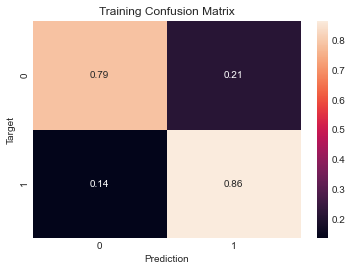

In [147]:
train_preds = predict_and_plot(X_train, train_targets, 'Training')

Accuracy: 82.25%


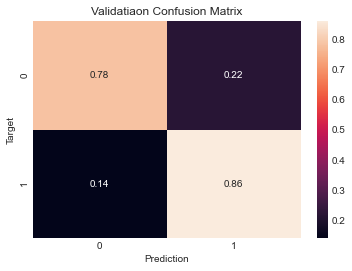

In [148]:
val_preds = predict_and_plot(X_val, val_targets, 'Validatiaon')

Accuracy: 82.88%


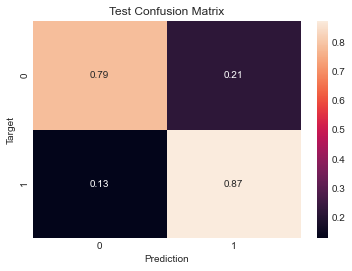

In [149]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')

The accuracy of the model on the test and validation set are above 82%, which suggests that our model generalizes well to data.

## Decision Tree 

### Training and Visualizing Decision Trees

A decision tree in general parlance represents a hierarchical series of binary decisions:

A decision tree in machine learning works in exactly the same way, and except that we let the computer figure out the optimal structure & hierarchy of decisions, instead of coming up with criteria manually.

In [150]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, train_targets)

DecisionTreeClassifier(random_state=42)

In [151]:
train_preds = model.predict(X_train)

In [152]:
train_preds

array([0, 1, 0, ..., 1, 0, 0])

In [153]:
pd.value_counts(train_preds)/len(train_targets)

1    0.545302
0    0.454698
dtype: float64

In [154]:
train_probs = model.predict_proba(X_train)

In [155]:
accuracy_score(train_targets, train_preds)

0.8857742782152231

The training set accuracy is close to 88% But we can't rely solely on the training set accuracy, we must evaluate the model on the validation set too.

We can make predictions and compute accuracy in one step using model.score

In [156]:
model.score(X_val, val_targets)

0.8245853453705647

In [157]:
val_targets.value_counts() / len(val_targets)

0    0.50168
1    0.49832
Name: over50k, dtype: float64

In [158]:
model.score(X_test, test_targets)

0.8239554902372455

In [159]:
test_targets.value_counts() / len(test_targets)

0    0.502519
1    0.497481
Name: over50k, dtype: float64

In [160]:
X_train.shape

(28575, 60)

### Visualization 

In [161]:
from sklearn.tree import plot_tree, export_text

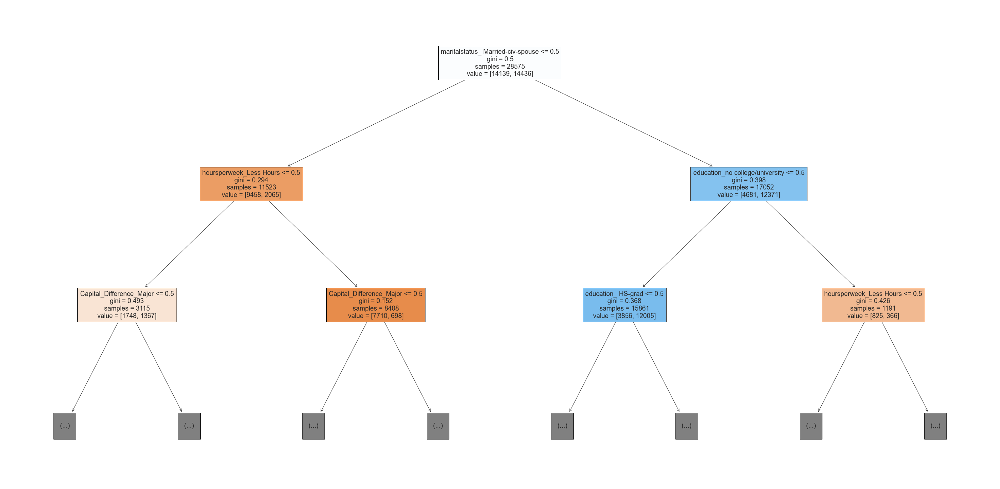

In [162]:
plt.figure(figsize=(50,25))
plot_tree(model, feature_names=X_train.columns, max_depth=2, filled=True);

Note the gini value in each box. This is the loss function used by the decision tree to decide which features should be used for splitting the data, and at what point the features should be split. A lower Gini index indicates a better split. A perfect split (only one class on each side) has a Gini index of 0.

### Feature Importance 

Based on the gini index computations, a decision tree assigns an "importance" value to each feature. These values can be used to interpret the results given by a decision tree.

In [163]:
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

In [164]:
importance_df.head(61)

,feature,importance
19,maritalstatus_ Married-civ-spouse,0.415508
56,hoursperweek_Less Hours,0.066201
16,education_no college/university,0.049599
58,Capital_Difference_Major,0.041795
12,education_ HS-grad,0.039600
55,age_young,0.034949
38,relationship_ Husband,0.017295
15,education_ Some-college,0.015768
27,occupation_ Exec-managerial,0.013040
33,occupation_ Prof-specialty,0.012940


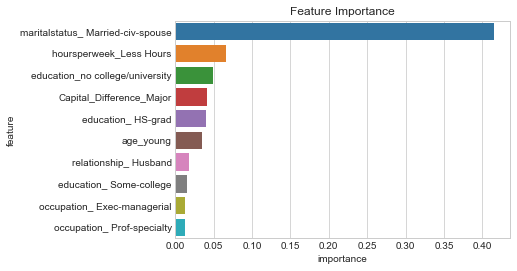

In [165]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

## Gaussian Naive Bayesian

In [166]:
#### 'workclass'
wc = pd.get_dummies(df[["workclass"]],drop_first = True)
df = pd.concat([df,wc],axis=1)
### 'education' 
edu = pd.get_dummies(df[["education"]],drop_first = True)
df = pd.concat([df,edu],axis=1)
### 'maritalstatus'
ms = pd.get_dummies(df[["maritalstatus"]],drop_first = True)
df = pd.concat([df,ms],axis=1)
### 'occupation'
occu =pd.get_dummies(df[["occupation"]],drop_first = True)
df = pd.concat([df,occu],axis=1) 
### 'relationship'
rel =pd.get_dummies(df[["relationship"]],drop_first = True)
df = pd.concat([df,rel],axis=1)
### 'race'
race = pd.get_dummies(df[["race"]],drop_first = True)
df = pd.concat([df,race],axis=1) 
#### 'age'
ag = pd.get_dummies(df[["age"]],drop_first = True)
df = pd.concat([df,ag],axis=1)
### 'nativecountry'
nc = pd.get_dummies(df[["nativecountry"]],drop_first = True) 
df = pd.concat([df,nc],axis=1)
### 'hoursperweek' 
hpw = pd.get_dummies(df[["hoursperweek"]],drop_first = True)
df = pd.concat([df,hpw],axis=1)
### 'Capital_Difference'
cd = pd.get_dummies(df[["Capital_Difference"]],drop_first = True)
df = pd.concat([df,cd],axis=1)


In [167]:
##checking the head
df.head()

,workclass,education,maritalstatus,occupation,relationship,race,sex,nativecountry,age,hoursperweek,over50k,Capital_Difference,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Prof-school,education_ Some-college,education_no college/university,maritalstatus_ Married-AF-spouse,maritalstatus_ Married-civ-spouse,maritalstatus_ Married-spouse-absent,maritalstatus_ Never-married,maritalstatus_ Separated,maritalstatus_ Widowed,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Black,race_ White,race_others,age_adult,age_senior,age_old,nativecountry_others,hoursperweek_Normal Hours,Capital_Difference_Major
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,adult,Less Hours,0,Minor,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,adult,Less Hours,0,Minor,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,adult,Less Hours,0,Minor,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0
3,Private,no college/university,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,senior,Less Hours,0,Minor,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,others,adult,Less Hours,0,Minor,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0


In [168]:
###Creating a function for converting binary variable
def binary(x):
    if x == "Male":
        return 1
    else:
        return 0

In [169]:
df["sex"] = df["sex"].apply(binary)

In [170]:
###dropping the columns as dummy has been created
df.drop(['workclass','education','maritalstatus','occupation','relationship','race','age','nativecountry','hoursperweek','Capital_Difference'],axis=1,inplace=True)

In [171]:
df.head()

,sex,over50k,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Prof-school,education_ Some-college,education_no college/university,maritalstatus_ Married-AF-spouse,maritalstatus_ Married-civ-spouse,maritalstatus_ Married-spouse-absent,maritalstatus_ Never-married,maritalstatus_ Separated,maritalstatus_ Widowed,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Black,race_ White,race_others,age_adult,age_senior,age_old,nativecountry_others,hoursperweek_Normal Hours,Capital_Difference_Major
0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0


In [174]:
### Creating X and y 
X = df.drop("over50k",axis=1)
X.head()

,sex,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Prof-school,education_ Some-college,education_no college/university,maritalstatus_ Married-AF-spouse,maritalstatus_ Married-civ-spouse,maritalstatus_ Married-spouse-absent,maritalstatus_ Never-married,maritalstatus_ Separated,maritalstatus_ Widowed,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Black,race_ White,race_others,age_adult,age_senior,age_old,nativecountry_others,hoursperweek_Normal Hours,Capital_Difference_Major
0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0
2,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0
3,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0
4,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,1,0,0


In [175]:
y = df["over50k"]
y.head()

0    0
1    0
2    0
3    0
4    0
Name: over50k, dtype: int32

Train-Test Split

In [176]:
from sklearn.model_selection import train_test_split

In [177]:
###Splitting the data into train-test set
X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.8,test_size=0.2,random_state=100)

In [179]:
from sklearn.naive_bayes import GaussianNB
gaussian = GaussianNB()
gaussian.fit(X_train, y_train)
y_pred = gaussian.predict(X_test)


In [180]:
accuracy = accuracy_score(y_test, y_pred) * 100
accuracy

79.34075162712575

In [181]:
##Printing the confusion matrix
print(confusion_matrix(y_test,y_pred))

[[3377 1348]
 [ 620 4181]]
